In [ ]:
!pip uninstall Cython -y

Found existing installation: Cython 3.0.10
Uninstalling Cython-3.0.10:
  Successfully uninstalled Cython-3.0.10


In [ ]:
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4109, done.
remote: Counting objects: 100% (4109/4109), done.
remote: Compressing objects: 100% (3110/3110), done.
remote: Total 4109 (delta 1190), reused 1984 (delta 937), pack-reused 0
Receiving objects: 100% (4109/4109), 45.36 MiB | 21.73 MiB/s, done.
Resolving deltas: 100% (1190/1190), done.


In [ ]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

In [ ]:
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.14.0', s)
    f.write(s)

In [ ]:
!pip install pyyaml
!pip install /content/models/research/
!pip install tensorflow==2.13.0

Processing ./models/research
  Preparing metadata (setup.py) ... done
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1697355 sha256=ec000c9cbd90053b4d972df160c3923f1e2fdae8f6acd9084e9e5038717de331
  Stored in directory: /tmp/pip-ephem-wheel-cache-3a1uxz5y/wheels/53/dd/70/2de274d6c443c69d367bd6a5606f95e5a6df61aacf1435ec0d
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.1/524.1 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 76.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 69.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 87.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 41.0 MB/s eta 0:00:00
  Attemp

In [ ]:
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2024-07-19 21:46:13.546456: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-19 21:46:13.609906: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-19 21:46:13.610586: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-19 21:46:14.898003: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Running tests under Python 3.10.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
W0719 21:46:18.728309 139924377284608 batch_normalization.py:1531] `tf.keras.layers.experimental.SyncBatchNormalization` endpoint is deprecated and will be removed in a future

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dxQhVOUFjV20aWhecsEs")
project = rf.workspace("licence-plate-3jqkb").project("license-plate-az47f")
version = project.version(1)
dataset = version.download("tensorflow")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.5 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to License-Plate-1 in tensorflow:: 100%|██████████| 9580/9580 [00:04<00:00, 2133.51it/s]


In [ ]:
### This creates a a "labelmap.txt" file with a list of classes the object detection model will detect.
%%bash
cat <<EOF>> /content/labelmap.txt
License Plate
EOF

In [ ]:
# Create TFRecord files
! wget https://raw.githubusercontent.com/Arijit1080/Licence-Plate-Detection-using-TensorFlow-Lite/main/create_tfrecord.py
!python3 create_tfrecord.py --csv_input=/content/License-Plate-Detector-1/train/_annotations.csv --labelmap=labelmap.txt --image_dir=License-Plate-Detector-1/train --output_path=/content/train.tfrecord
!python3 create_tfrecord.py --csv_input=/content/License-Plate-Detector-1/valid/_annotations.csv --labelmap=labelmap.txt --image_dir=/content/License-Plate-Detector-1/valid --output_path=/content/val.tfrecord

--2024-07-19 21:50:26--  https://raw.githubusercontent.com/Arijit1080/Licence-Plate-Detection-using-TensorFlow-Lite/main/create_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4414 (4.3K) [text/plain]
Saving to: ‘create_tfrecord.py’

create_tfrecord.py  100%[===================>]   4.31K  --.-KB/s    in 0s      

2024-07-19 21:50:26 (43.0 MB/s) - ‘create_tfrecord.py’ saved [4414/4414]

2024-07-19 21:50:27.112129: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-19 21:50:27.195579: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-19 21:50:27.196790: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlo

In [ ]:
train_record_fname = '/content/train.tfrecord'
val_record_fname = '/content/val.tfrecord'
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

In [ ]:
model_name = 'ssd_mobilenet_v2_320x320_coco17_tpu-8'
pretrained_checkpoint = 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz'
base_pipeline_file = 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config'

In [ ]:
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

mkdir: cannot create directory ‘/content/models/mymodel/’: File exists
/content/models/mymodel
--2024-07-19 21:51:27--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.203.207, 74.125.199.207, 74.125.20.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.203.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46042990 (44M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz.1’

ssd_mobilenet_v2_32 100%[===================>]  43.91M   236MB/s    in 0.2s    

2024-07-19 21:51:28 (236 MB/s) - ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz.1’ saved [46042990/46042990]

--2024-07-19 21:51:28--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githu

In [ ]:
num_steps = 3000
batch_size = 16

In [ ]:
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)

Total classes: 1


In [ ]:
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    s = re.sub('learning_rate_base: .8','learning_rate_base: .08', s)

    s = re.sub('warmup_learning_rate: 0.13333','warmup_learning_rate: .026666', s)

    f.write(s)

/content/models/mymodel
writing custom configuration file


In [ ]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

In [ ]:
# Run training!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

2024-07-19 21:52:37.737520: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
I0719 21:52:41.378678 133268760920064 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 3000
I0719 21:52:41.413467 133268760920064 config_util.py:552] Maybe overwriting train_steps: 3000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0719 21:52:41.413701 133268760920064 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0719 21:52:41.468967 133268760920064 deprecation.py:364] From /usr/local/lib/python3.10/dist-packages/object_detection/model_lib_v2.py:563: StrategyBase.experimental_distribute_datasets_from_function (from tensorflow.python.distribute.distribute_lib) is de

In [ ]:
!mkdir /content/custom_model_lite
output_directory = '/content/custom_model_lite'

last_model_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

2024-07-20 02:51:42.095036: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I0720 02:51:54.021691 138474594701312 api.py:460] feature_map_spatial_dims: [(19, 19), (10, 10), (5, 5), (3, 3), (2, 2), (1, 1)]
INFO:tensorflow:depth of additional conv before box predictor: 0
I0720 02:51:57.006562 138474594701312 convolutional_keras_box_predictor.py:152] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0720 02:51:57.007054 138474594701312 convolutional_keras_box_predictor.py:152] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0720 02:51:57.007323 138474594701312 convolutional_keras_box_predictor.py:152] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0720 02:51:57.007512 138474594701312 convolutional_keras_box_predictor.py:152] depth of additional 

#**Converting to TFLie model**

In [ ]:
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  images_to_test = random.sample(images, num_test_images)

  for image_path in images_to_test:

      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      if txt_only == False:
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      elif txt_only == True:

        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

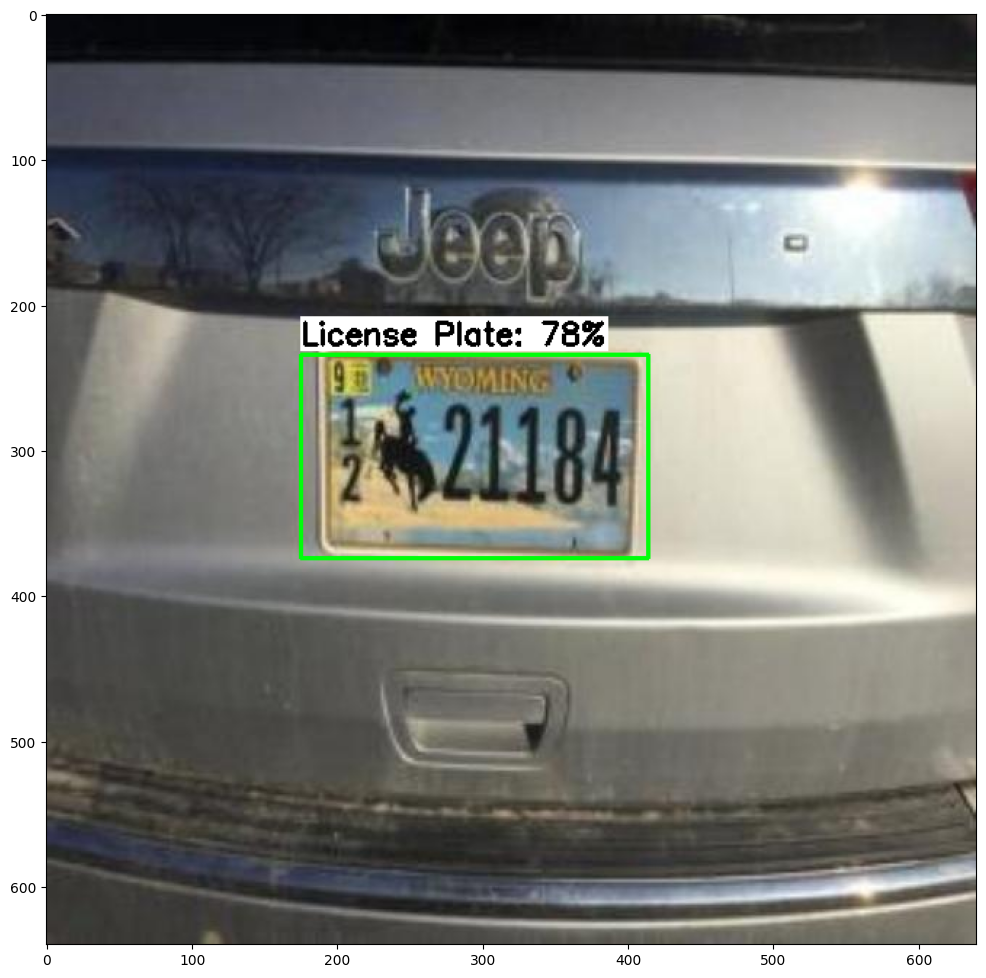

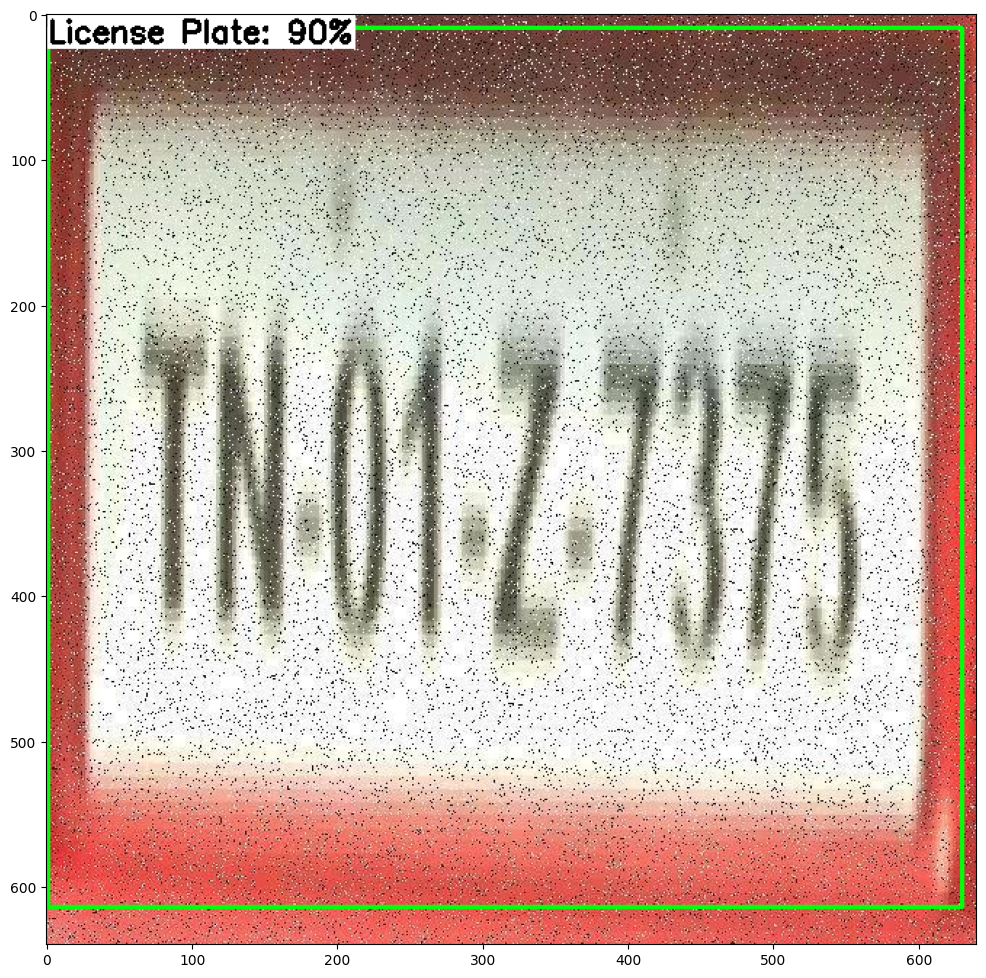

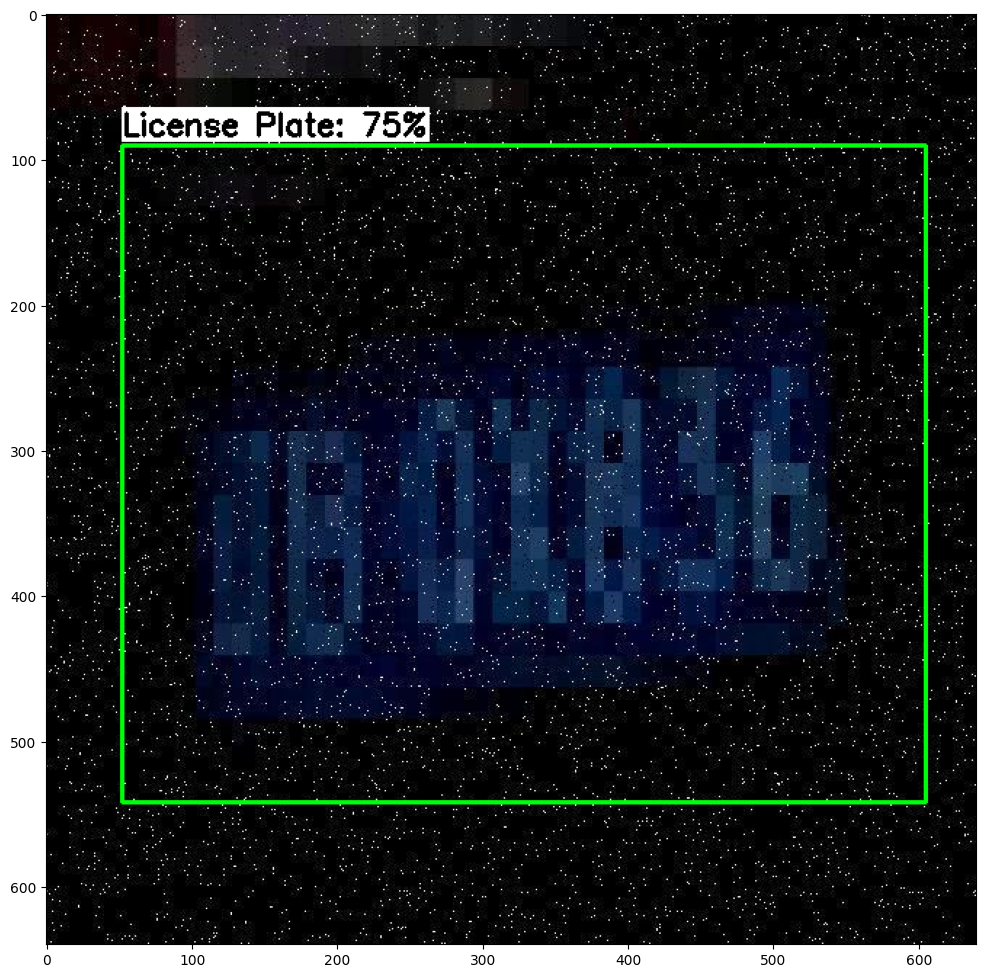

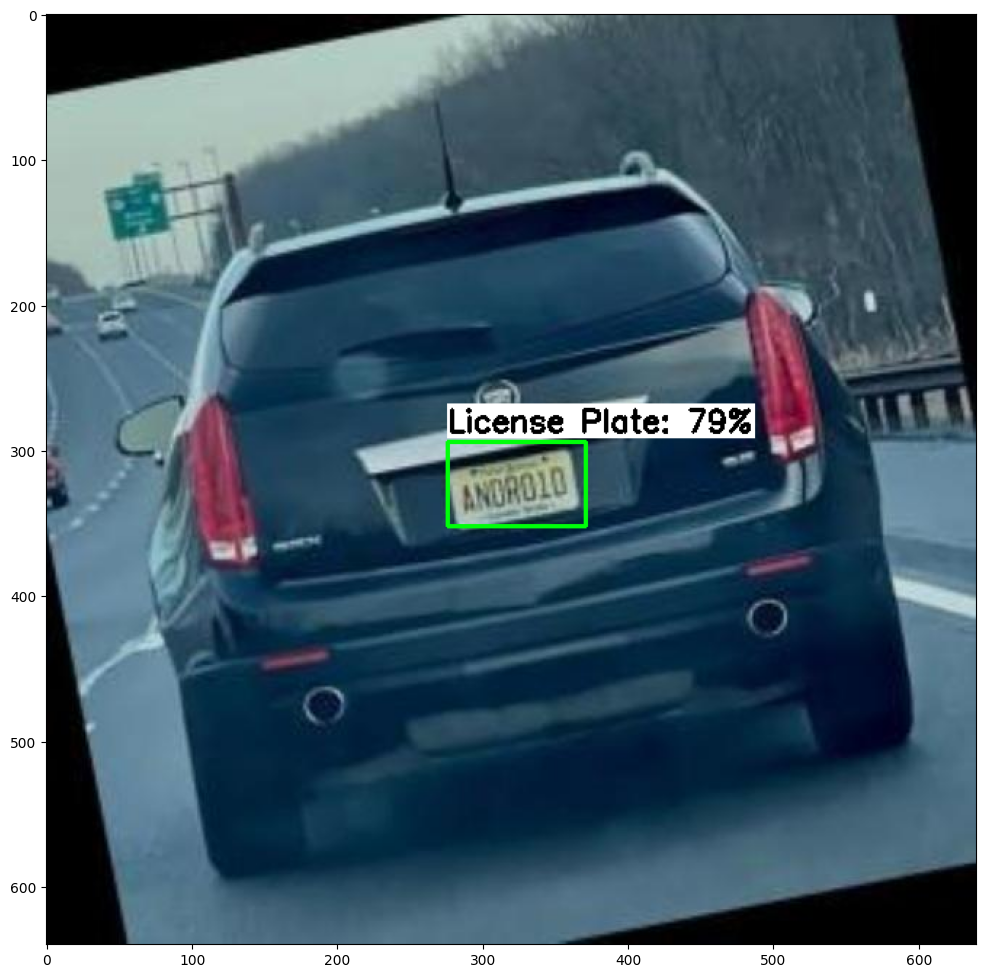

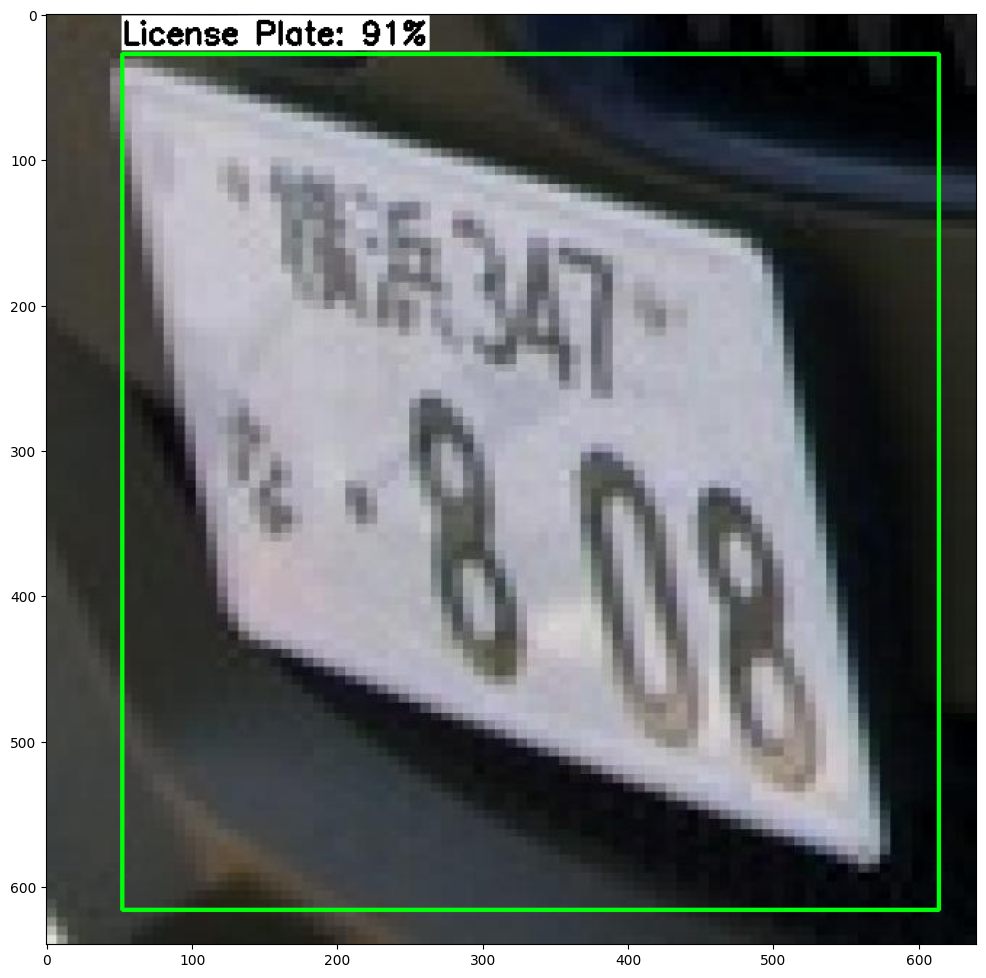

...

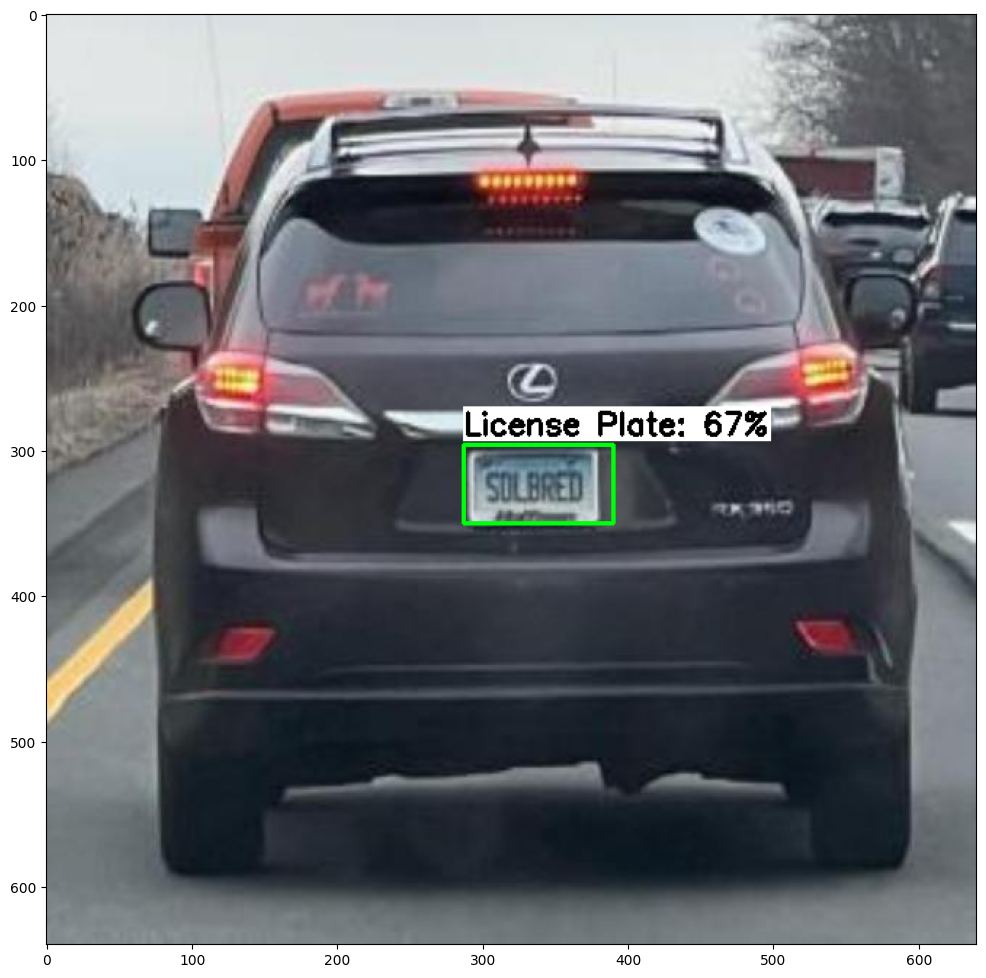

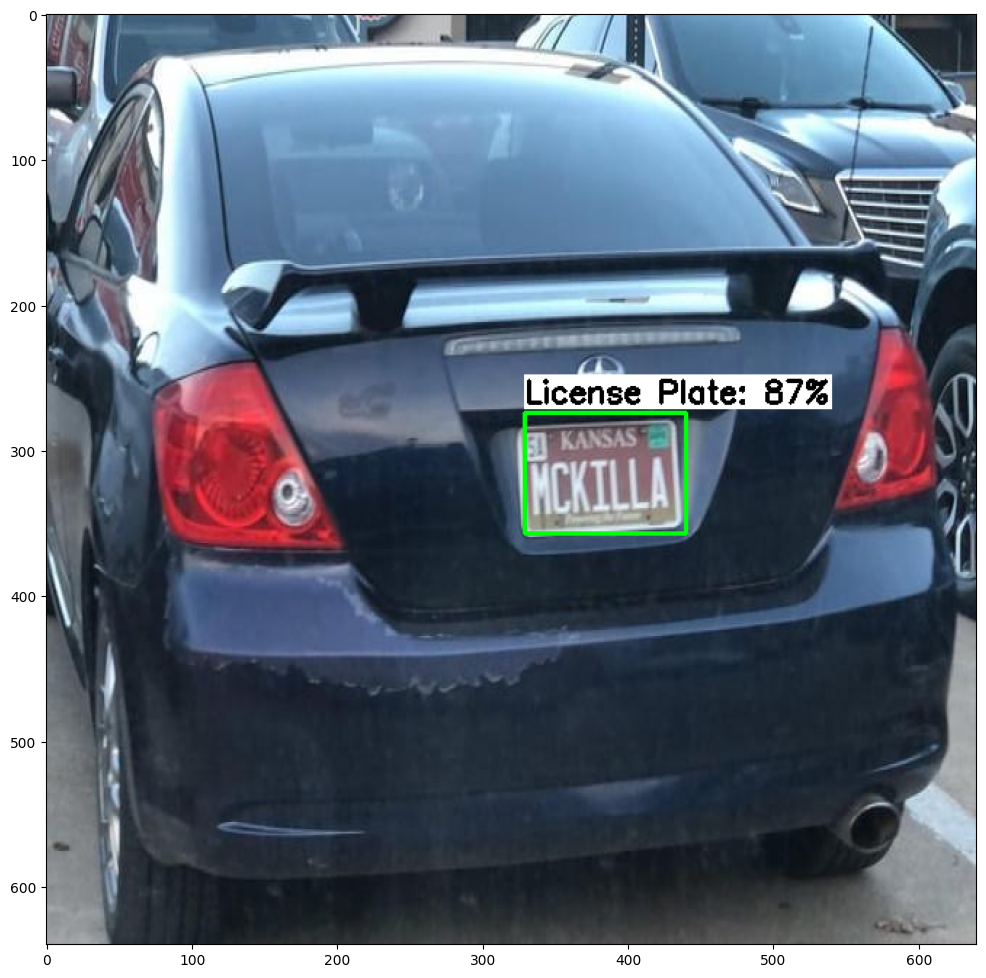

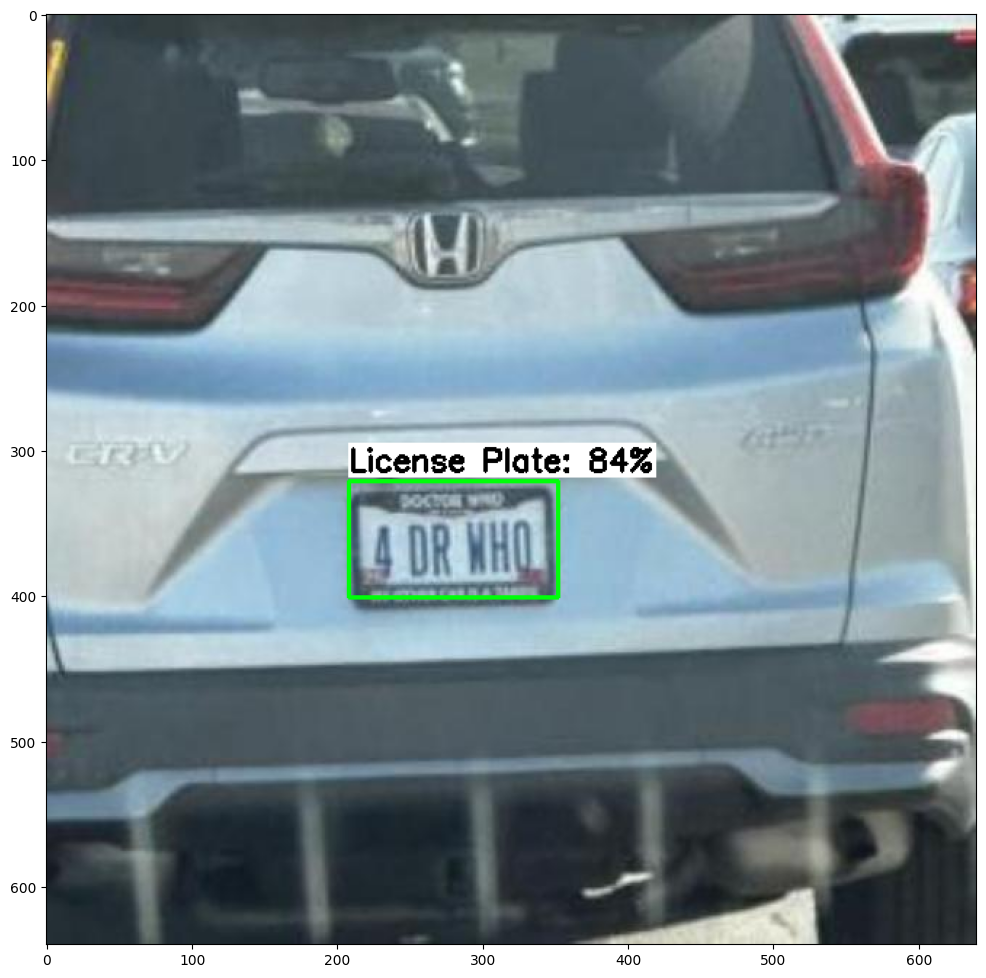

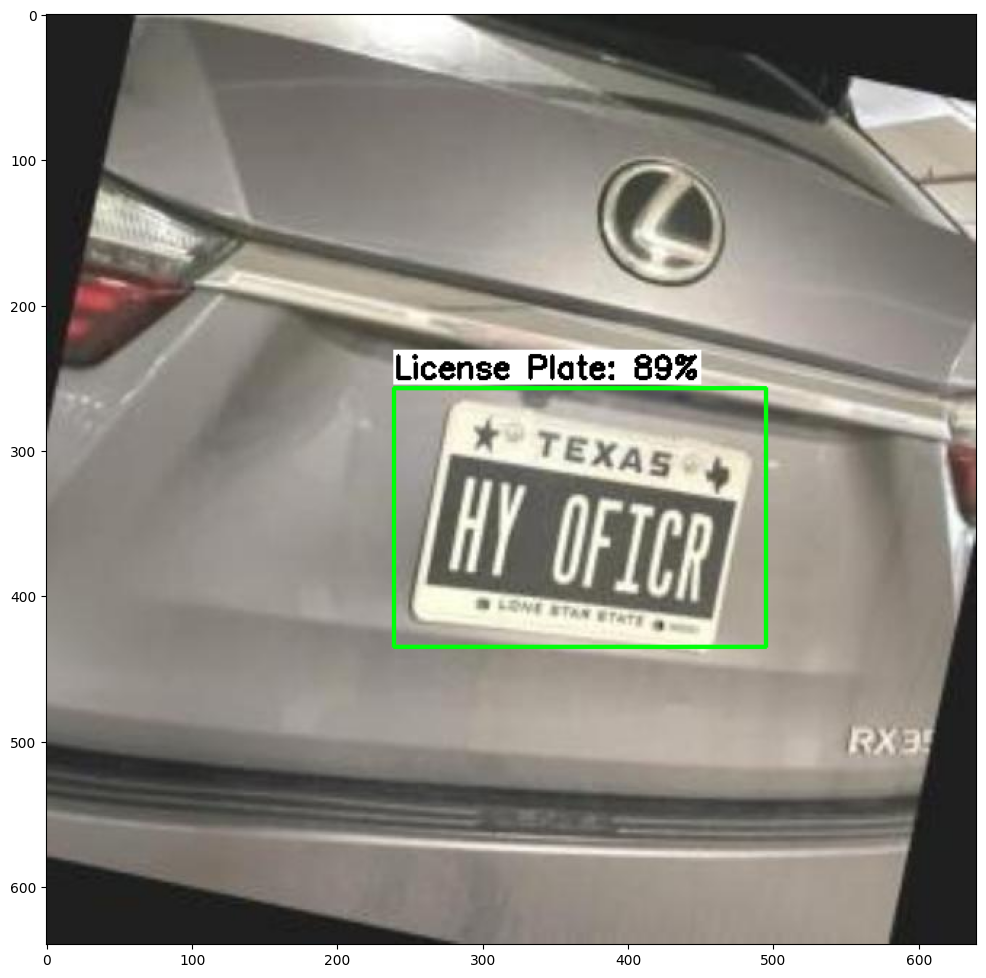

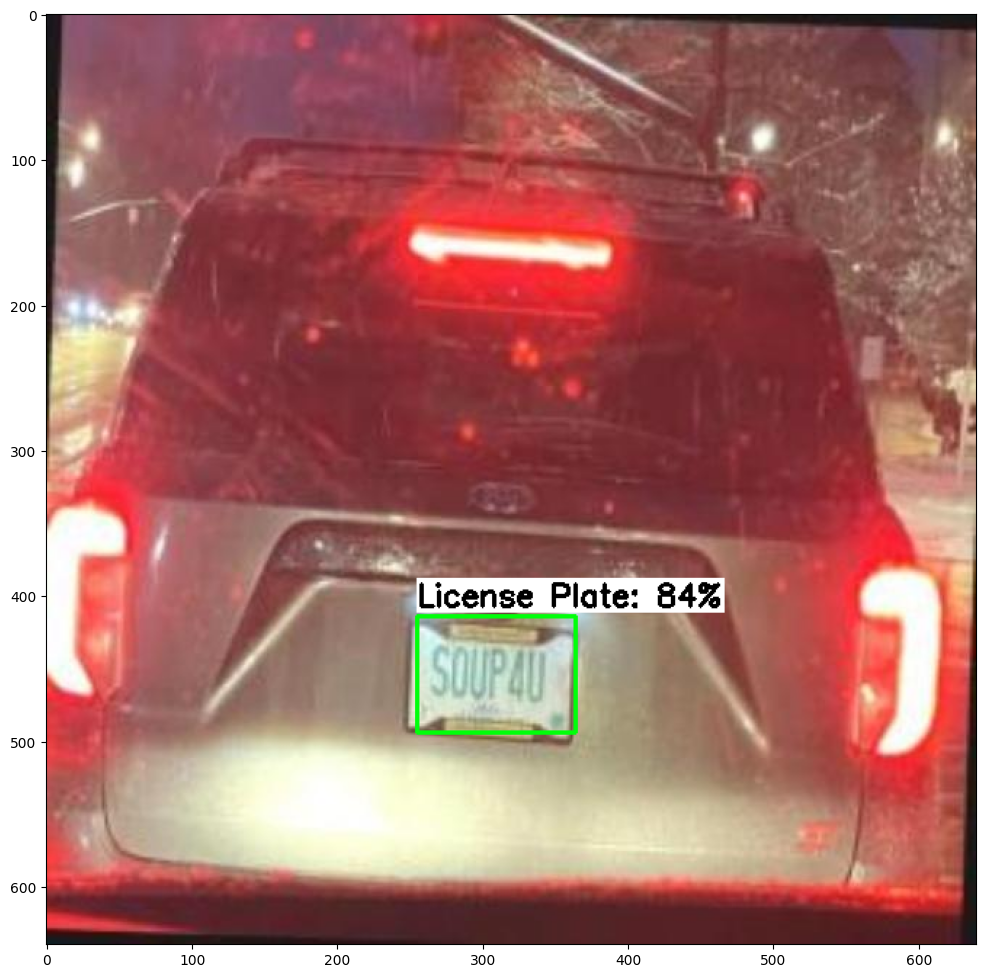

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content/License-Plate-Detector-1/test'
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'
PATH_TO_LABELS='/content/labelmap.txt'
min_conf_threshold=0.5
images_to_test = 20

tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

#**Zipped File for Edge Devices**
1. labelmap.txt
2. labelmap.pbtxt
3. pipeline_file.config

In [ ]:
# Move labelmap and pipeline config files into TFLite model folder and zip it up
!cp /content/labelmap.txt /content/custom_model_lite
!cp /content/labelmap.pbtxt /content/custom_model_lite
!cp /content/models/mymodel/pipeline_file.config /content/custom_model_lite

%cd /content
!zip -r custom_model_lite.zip custom_model_lite

/content
  adding: custom_model_lite/ (stored 0%)
  adding: custom_model_lite/pipeline_file.config (deflated 67%)
  adding: custom_model_lite/saved_model/ (stored 0%)
  adding: custom_model_lite/saved_model/fingerprint.pb (stored 0%)
  adding: custom_model_lite/saved_model/saved_model.pb (deflated 91%)
  adding: custom_model_lite/saved_model/variables/ (stored 0%)
  adding: custom_model_lite/saved_model/variables/variables.index (deflated 77%)
  adding: custom_model_lite/saved_model/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: custom_model_lite/saved_model/assets/ (stored 0%)
  adding: custom_model_lite/labelmap.txt (stored 0%)
  adding: custom_model_lite/detect.tflite (deflated 7%)
  adding: custom_model_lite/labelmap.pbtxt (stored 0%)


In [ ]:
from google.colab import files

files.download('/content/custom_model_lite.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
pwd

'/content'

In [ ]:
cd /content/LicenseDetector.py


[Errno 20] Not a directory: '/content/LicenseDetector.py'
/content
